# M07463 Analysis (ephax Quickstart Style)

This notebook loads recording sessions from the `M07463` data directory and runs the same core analyses as `ephax_quickstart.ipynb`.


In [1]:
%matplotlib inline
import re
import sys
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display

repo_root = Path.cwd()
if not (repo_root / "ephax").exists() and (repo_root.parent / "ephax").exists():
    repo_root = repo_root.parent
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

from ephax import RestingActivityDataset, PrepConfig, LayoutGridPlotter, DCTAnalyzer
from ephax.analyzers import IFRAnalyzer
from ephax.analyzers.ifr import IFRConfig
from ephax.analyzers.firing_distance import FiringDistanceAnalyzer
from ephax.analyzers.cofiring_temporal import CofiringTemporalAnalyzer, CofiringTemporalConfig

plt.rcParams["figure.dpi"] = 120
np.random.seed(0)


/Users/danielrebbin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/danielrebbin/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## Configure Session Loading

- Set `START_SEC`, `END_SEC`, and `MIN_AMP` as needed.
- For `.h5` files, wells are inferred from filenames like `...well_0...`.
- Use `WELL_OVERRIDES` when a filename does not include a well number.


In [2]:
WINDOW_MODE = "recording_relative"  # "recording_relative" or "absolute"
START_SEC = 0
END_SEC = 300
MIN_AMP = 0

WELL_OVERRIDES = {
    # "my_recording_file.raw.h5": 0,
}

m07463_dir_candidates = [
    repo_root / "data" / "M07463",
    repo_root / "ephax" / "data" / "M07463",
    repo_root / "M07463",
    Path("/Volumes/levinlab_braintrix$/HALnalysis/data/preprocessed/M07463"),
    Path("/run/user/1001/gvfs/smb-share:server=rstore.it.tufts.edu,share=levinlab_braintrix$/HALnalysis/data/preprocessed/M07463"),
]
m07463_root = next((p for p in m07463_dir_candidates if p.exists()), None)
if m07463_root is None:
    raise FileNotFoundError(
        "Could not find M07463 directory. Expected one of: "
        + ", ".join(str(p) for p in m07463_dir_candidates)
    )

npz_files = sorted(set(m07463_root.rglob("*.npz")))
h5_files = sorted(set(m07463_root.rglob("*.raw.h5")) | set(m07463_root.rglob("*.h5")))

if npz_files:
    source = "npz"
    file_info = []
    for pth in npz_files:
        if WINDOW_MODE == "recording_relative":
            with np.load(pth, allow_pickle=True) as data:
                sf = float(np.asarray(data["samp_rate"]).reshape(-1)[0])
                frameno = np.asarray(data["spike_data"]["frameno"], dtype=float)
                if frameno.size == 0:
                    rec_t0 = 0.0
                else:
                    rec_t0 = float(np.min(frameno) / sf)
            start_sec = rec_t0 + START_SEC
            end_sec = rec_t0 + END_SEC
        else:
            start_sec = START_SEC
            end_sec = END_SEC
        file_info.append((str(pth), start_sec, end_sec, 0))
elif h5_files:
    source = "h5"

    def infer_well(path: Path):
        name = path.name
        if name in WELL_OVERRIDES:
            return int(WELL_OVERRIDES[name])
        m = re.search(r"well[_-]?(\d+)", str(path), flags=re.IGNORECASE)
        return int(m.group(1)) if m else None

    unresolved = []
    file_info = []
    for pth in h5_files:
        well = infer_well(pth)
        if well is None:
            unresolved.append(pth.name)
            continue
        file_info.append((str(pth.parent), pth.name, START_SEC, END_SEC, well))

    if unresolved:
        raise ValueError(
            "Could not infer well number for these files: "
            + ", ".join(unresolved)
            + ". Add them to WELL_OVERRIDES."
        )
else:
    raise FileNotFoundError(f"No .npz or .h5 files found under {m07463_root}")

print(f"Using M07463 root: {m07463_root}")
print(f"Detected source type: {source}")
print(f"Window mode: {WINDOW_MODE}")
print(f"Number of sessions: {len(file_info)}")
for entry in file_info[:10]:
    print("  ", entry)
if len(file_info) > 10:
    print(f"  ... and {len(file_info) - 10} more")

# Per-recording labels parsed from path (well index + DIV)
recording_labels = []
for entry in file_info:
    if source == "npz":
        pth = Path(entry[0])
    else:
        pth = Path(entry[0]) / entry[1]
    txt = str(pth)
    m_w = re.search(r"well[_-]?(\d+)", txt, flags=re.IGNORECASE)
    m_d = re.search(r"DIV[_-]?(\d+)", txt, flags=re.IGNORECASE)
    well_lbl = f"well{m_w.group(1)}" if m_w else "well?"
    div_lbl = f"DIV{m_d.group(1)}" if m_d else "DIV?"
    recording_labels.append(f"{well_lbl}_{div_lbl}")
print("Example labels:", recording_labels[:10])


Using Scans directory: ephax/data/Scans
Detected source type: npz
Number of sessions: 24
   ('ephax/data/Scans/M09068/250811/data_well_1_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/M09072/250811/data_well_1_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003638/250801/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003638/250804/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003638/250806/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003638/250811/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003643/250801/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003643/250804/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003643/250806/data_well_0_exp_data.npz', 0, 300, 0)
   ('ephax/data/Scans/P003643/250811/data_well_0_exp_data.npz', 0, 300, 0)
  ... and 14 more


In [3]:
ds = RestingActivityDataset.from_file_info(file_info, source=source, min_amp=MIN_AMP)
print(f"Loaded {len(ds.recordings)} recordings")
print(f"Sampling rate: {ds.sf}")


Loaded 24 recordings
Sampling rate: [20000.]


## Exclude Low-Activity Recordings

Use this block to remove recordings with too little activity before running analyses. 
All downstream cells use the filtered dataset.


In [17]:
# Automatic + manual exclusion settings
MIN_TOTAL_SPIKES = 300          # exclude recordings below this spike count in [START_SEC, END_SEC]
MIN_ACTIVE_ELECTRODES = 25      # exclude recordings with fewer active electrodes
MANUAL_EXCLUDE_IDX = []         # e.g., [0, 14, 16, 21, 22, 23]

kept_recordings = []
kept_labels = []
activity_rows = []

for rec_idx, rec in enumerate(ds.recordings):
    rec_label = recording_labels[rec_idx] if rec_idx < len(recording_labels) else f"Recording {rec_idx+1}"
    duration = float(rec.end_time - rec.start_time)
    times = np.asarray(rec.spikes.get("time", np.array([], dtype=float)), dtype=float)
    electrodes = np.asarray(rec.spikes.get("electrode", np.array([], dtype=int)))
    in_window = (times >= rec.start_time) & (times <= rec.end_time)
    total_n_spikes = int(times.size)
    n_spikes = int(np.sum(in_window))
    total_n_active_electrodes = int(np.unique(electrodes).size)
    n_active_electrodes = int(np.unique(electrodes[in_window]).size) if n_spikes else 0
    mean_hz = (n_spikes / duration) if duration > 0 else 0.0

    auto_exclude = (n_spikes < MIN_TOTAL_SPIKES) or (n_active_electrodes < MIN_ACTIVE_ELECTRODES)
    manual_exclude = rec_idx in MANUAL_EXCLUDE_IDX
    keep = not (auto_exclude or manual_exclude)

    activity_rows.append({
        "recording_label": rec_label,
        "recording_idx": rec_idx,
        "duration_s": round(duration, 3),
        "total_n_spikes": total_n_spikes,
        "n_spikes": n_spikes,
        "total_n_active_electrodes": total_n_active_electrodes,
        "n_active_electrodes": n_active_electrodes,
        "mean_spike_rate_hz": mean_hz,
        "auto_exclude": auto_exclude,
        "manual_exclude": manual_exclude,
        "keep": keep,
    })

    if keep:
        kept_recordings.append(rec)
        kept_labels.append(rec_label)

import pandas as pd
activity_summary = pd.DataFrame(activity_rows)
print(f"Original recordings: {len(ds.recordings)}")
print(f"Kept recordings: {len(kept_recordings)}")
print(f"Excluded recordings: {len(ds.recordings) - len(kept_recordings)}")

excluded_idx = activity_summary.loc[~activity_summary["keep"], "recording_idx"].tolist()
print("Excluded recording indices:", excluded_idx)

if not kept_recordings:
    raise ValueError("All recordings were excluded. Relax thresholds or clear MANUAL_EXCLUDE_IDX.")

# Rebuild dataset for all downstream analyses
ds = RestingActivityDataset(recordings=kept_recordings, sf=ds.sf)
recording_labels = kept_labels
activity_summary


Original recordings: 17
Kept recordings: 17
Excluded recordings: 0
Excluded recording indices: []


,recording_idx,duration_s,n_spikes,n_active_electrodes,mean_spike_rate_hz,auto_exclude,manual_exclude,keep
0,0,300.0,113971,659,379.903333,False,False,True
1,1,300.0,153867,894,512.890000,False,False,True
2,2,300.0,113024,949,376.746667,False,False,True
3,3,300.0,217891,971,726.303333,False,False,True
4,4,300.0,87494,841,291.646667,False,False,True
5,5,300.0,100804,905,336.013333,False,False,True
6,6,300.0,274667,955,915.556667,False,False,True
7,7,300.0,142096,942,473.653333,False,False,True
8,8,300.0,41251,682,137.503333,False,False,True
9,9,300.0,49051,580,163.503333,False,False,True


## Layout Grid Visualizations

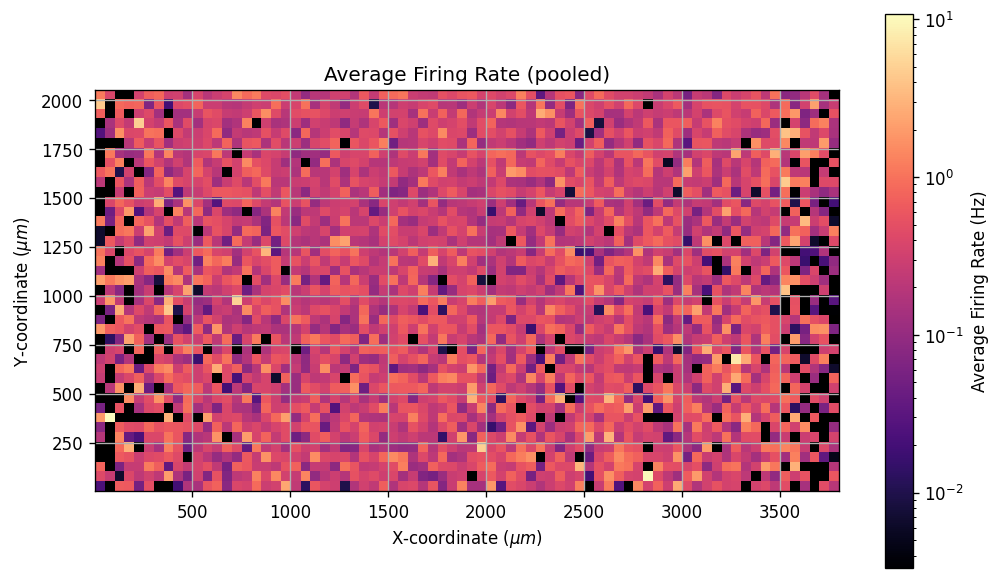

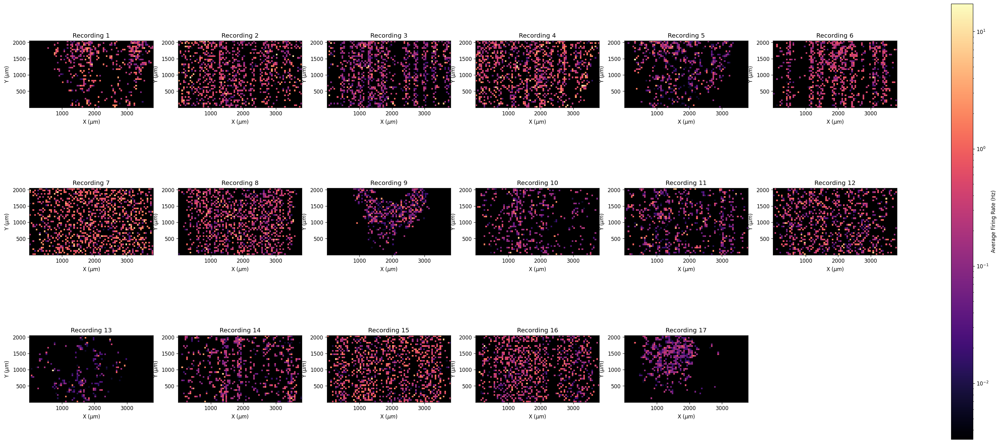

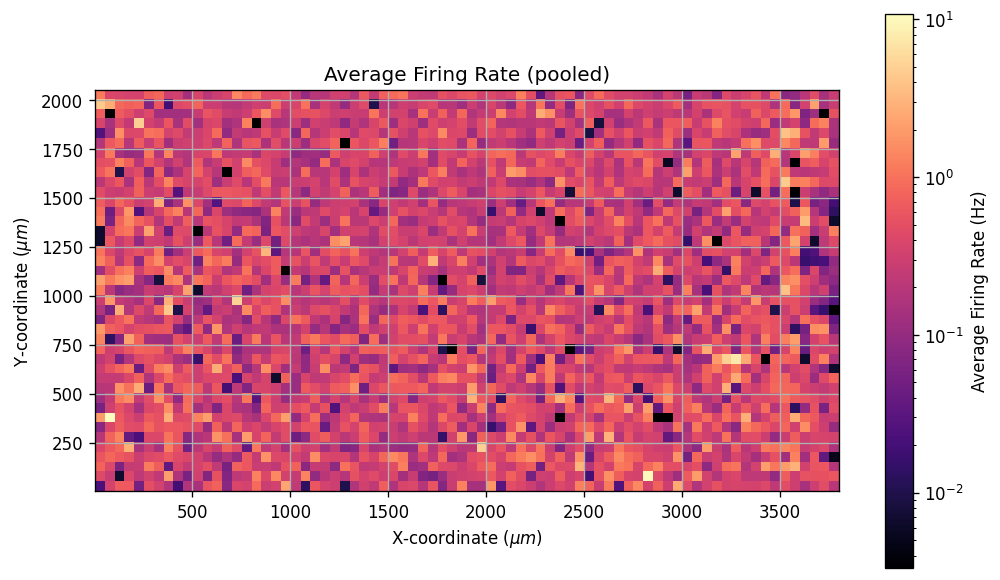

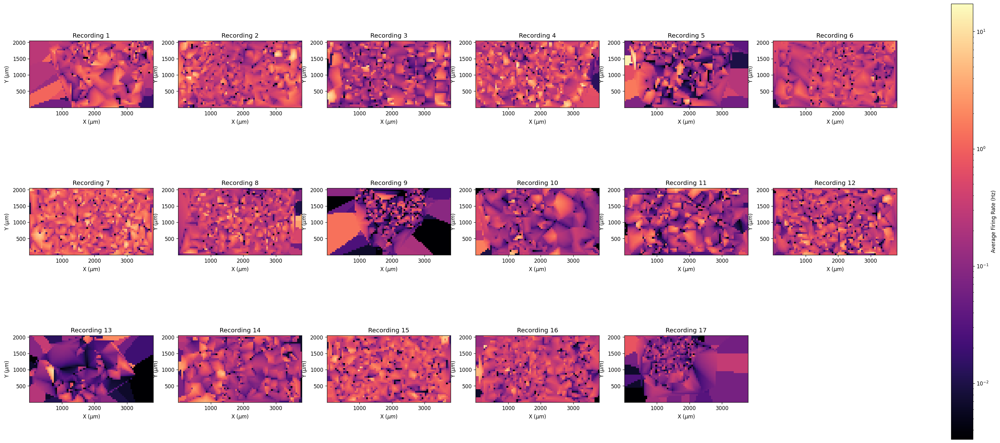

(<Figure size 3600x1440 with 19 Axes>,
 array([[<Axes: title={'center': 'Recording 1'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 2'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 3'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 4'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 5'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 6'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>],
        [<Axes: title={'center': 'Recording 7'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 8'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 9'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,
         <Axes: title={'center': 'Recording 10'}, xlabel='X ($\\mu m$)', ylabel='Y ($\\mu m$)'>,

In [18]:
lg = LayoutGridPlotter(ds)

# Without interpolation
lg.plot_grid_avghz_pooled(grid_size=50.0, interpolate=False, title="M07463: Average Firing Rate (pooled)")
lg.plot_grid_avghz_panel(grid_size=50.0, ncols=6, interpolate=False, title="M07463: Per-recording Layout Grid", recording_titles=recording_labels)

# With interpolation
lg.plot_grid_avghz_pooled(grid_size=50.0, interpolate=True, title="M07463: Average Firing Rate (pooled, interpolated)")
lg.plot_grid_avghz_panel(grid_size=50.0, ncols=6, interpolate=True, title="M07463: Per-recording Layout Grid (interpolated)", recording_titles=recording_labels)


## Select Reference Electrodes

In [5]:
top_stop = 100
prep_cfg = PrepConfig(mode="top", top_start=0, top_stop=top_stop, verbose=False)
refs_per_recording = ds.select_ref_electrodes(prep_cfg)

for idx, refs in enumerate(refs_per_recording):
    preview = ", ".join(map(str, refs[:5])) + ("..." if refs.size > 5 else "")
    print(f"Recording {idx}: selected {refs.size} reference electrodes ({preview})")


Recording 0: selected 0 reference electrodes ()
Recording 1: selected 100 reference electrodes (19983, 22762, 9395, 24076, 22523...)
Recording 2: selected 100 reference electrodes (11682, 20853, 20222, 25788, 13008...)
Recording 3: selected 100 reference electrodes (10597, 4843, 16132, 18223, 1875...)
Recording 4: selected 100 reference electrodes (15913, 8768, 22864, 6311, 822...)
Recording 5: selected 100 reference electrodes (18720, 11280, 2972, 20584, 7780...)
Recording 6: selected 100 reference electrodes (11615, 5984, 7987, 4945, 19260...)
Recording 7: selected 100 reference electrodes (4569, 2508, 12642, 25081, 24251...)
Recording 8: selected 100 reference electrodes (15047, 2030, 5656, 17482, 15451...)
Recording 9: selected 100 reference electrodes (15696, 18392, 19051, 19969, 22095...)
Recording 10: selected 100 reference electrodes (16349, 1162, 6675, 20966, 14758...)
Recording 11: selected 100 reference electrodes (11901, 25609, 21512, 13339, 14804...)
Recording 12: selected

## Instantaneous Firing Rate (IFR)

In [21]:
ifr_cfg = IFRConfig(
    log_scale=True,
    hist_bins=200,
    overlay_gmm=True,
    time_grid_hz=200.0,
    max_time_points=2_000,
)
ifr_analyzer = IFRAnalyzer.from_dataset(ds, config=ifr_cfg, selection_prep_config=prep_cfg)
peaks = ifr_analyzer.peaks()

print(f"Collected {peaks.values.size} IFR samples")
if peaks.peaks_hz.size:
    print("GMM peak locations (Hz):", np.round(peaks.peaks_hz, 2))
else:
    print("No peaks detected; consider widening the selection window.")


Collected 1914624 IFR samples
GMM peak locations (Hz): [1.00000e-02 1.00000e-02 2.00000e-02 7.00000e-02 4.29000e+00 2.83600e+01
 2.23416e+03 6.67977e+03]


(<Figure size 1200x720 with 1 Axes>,
 <Axes: title={'center': 'Gaussian Mixture Model Fit to IFR Data'}, xlabel='Log(IFR)', ylabel='Density'>)

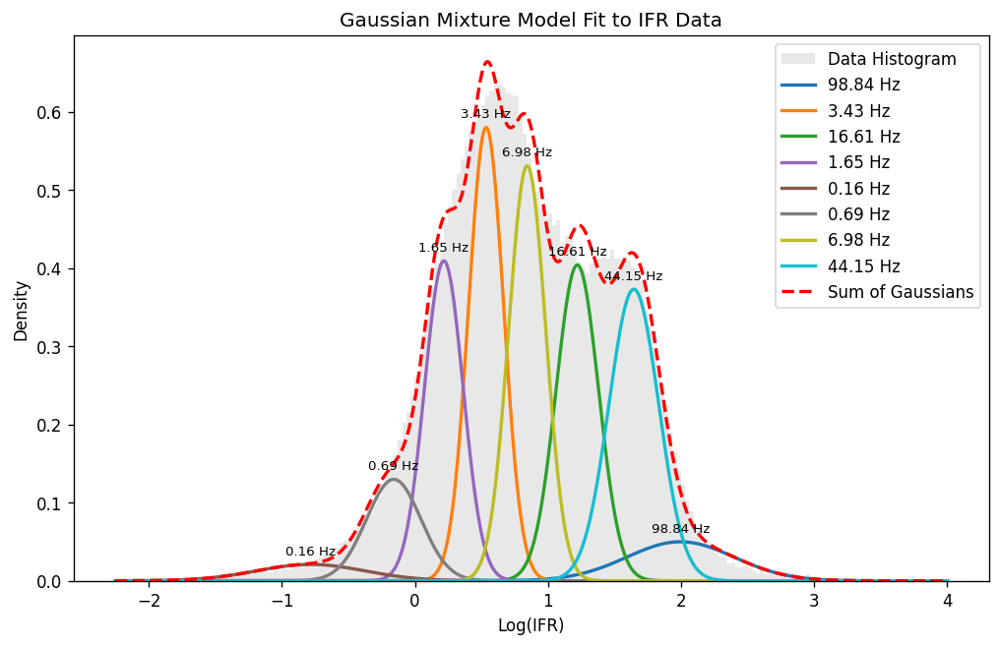

In [22]:
ifr_analyzer.plot_histogram()

In [ ]:
ifr_analyzer.plot_timeseries(title="M07463", recording_titles=recording_labels)

## Distance-Dependent Firing Statistics

/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (44.1, 98.8 Hz): logL=-24031.7698, BIC=-1402.0733, MI=1.90124
  Model (44.1 Hz): logL=-30609.8778, BIC=-1422.5206, MI=2.22803
[Rate] Likelihood-ratio tests vs full model:
  Model (44.1 Hz): LRT=13156.2160, p=0.000e+00
ANOVA F-statistic: 0.6325647785810913, p-value: 0.42651056594909875

[Cofiring] Synergy model summary:
  Model (44.1, 98.8 Hz): logL=2035.3933, BIC=-6918.4988, MI=1.95515
  Model (44.1 Hz): logL=2470.5414, BIC=-7867.8770, MI=2.52291
[Cofiring] Likelihood-ratio tests vs full model:
  Model (44.1 Hz): LRT=-870.2962, p=1.000e+00
ANOVA F-statistic: 5.084143071901473, p-value: 0.024253466245866336
Tukey's HSD Results:
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     -0.488     0.000    -0.510    -0.466
 (1 - 0)      0.488     0.000     0.466     0.510



(<Figure size 1200x1440 with 3 Axes>,
 <Axes: title={'center': 'Averaged Co-Firing Expectation vs. Distance'}, xlabel='Distance from Electrode ($\\mu m$)', ylabel='Mean Co-Firing Expectation (spikes per ref-spike)'>)

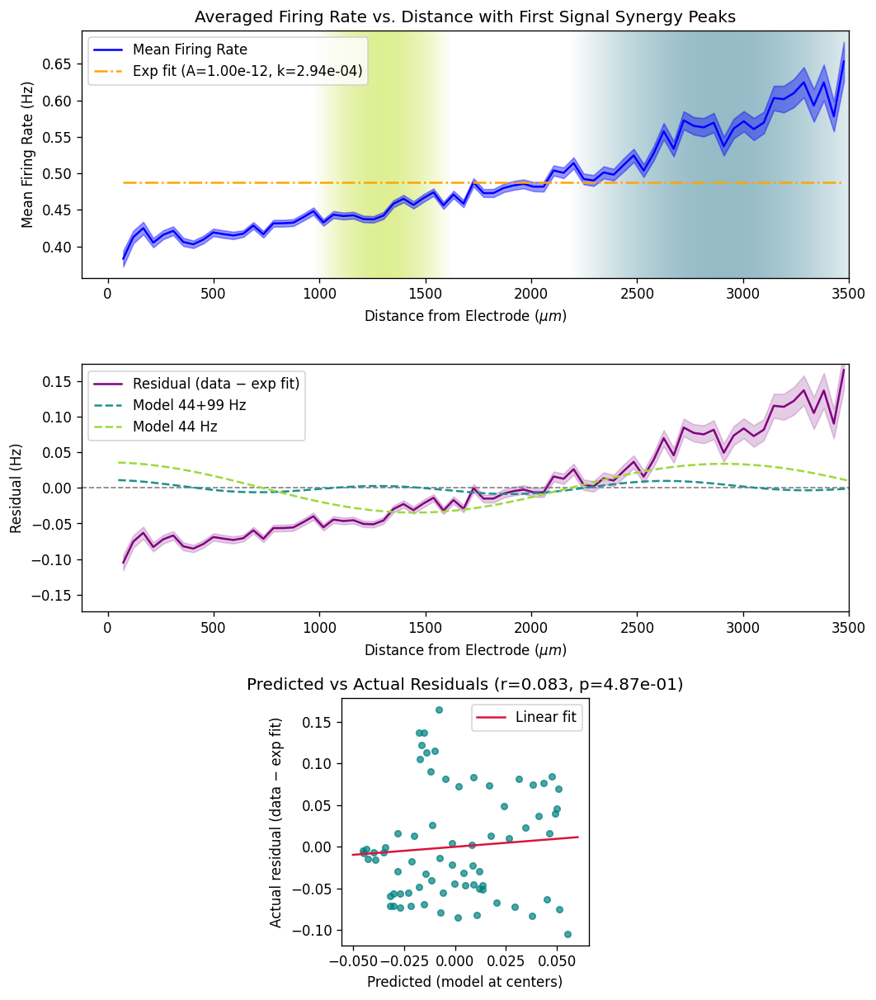

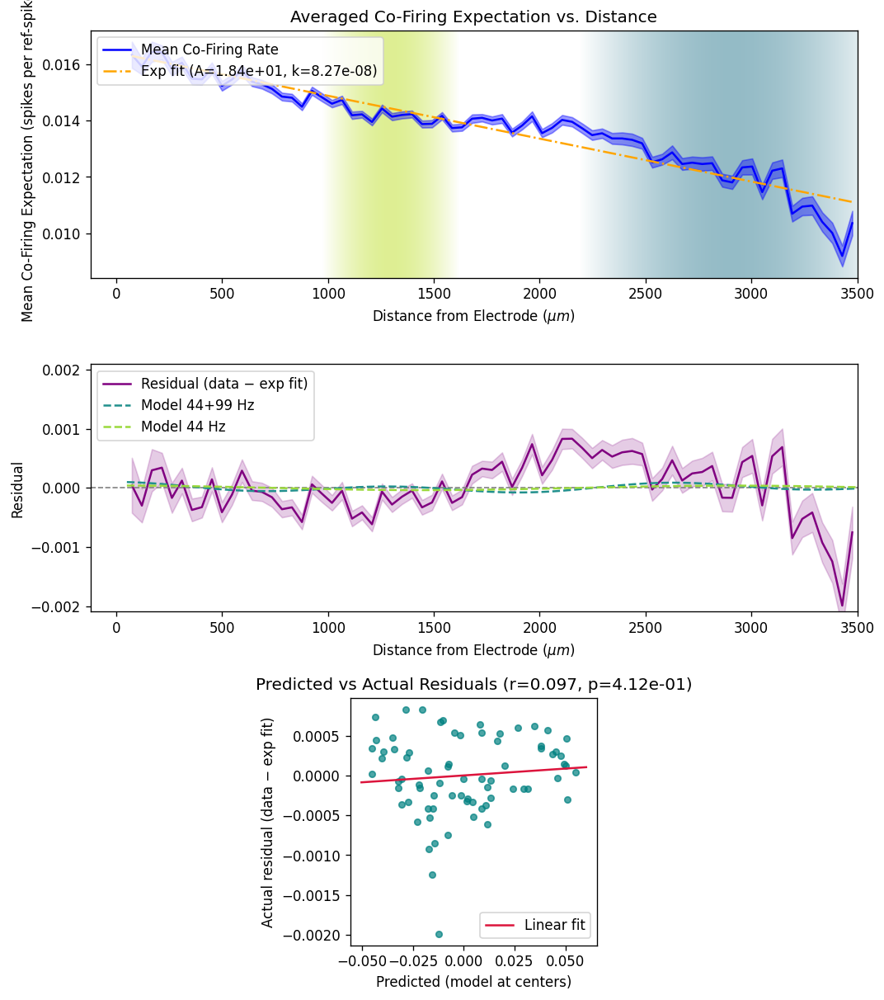

In [19]:
shuffle_layout_coordinates = True
permute_for_null = True
num_permutations = 2
perm_seed = 12345

perm_datasets = []
if permute_for_null:
    for perm_idx in range(num_permutations):
        permuted_recs = []
        for rec_idx, rec in enumerate(ds.recordings):
            seed = None if perm_seed is None else perm_seed + perm_idx * 1000 + rec_idx
            permuted_recs.append(
                rec.randomize_electrode_mapping(
                    seed=seed,
                    inplace=False,
                    shuffle_layout_coordinates=shuffle_layout_coordinates,
                )
            )
        perm_datasets.append(RestingActivityDataset(recordings=permuted_recs, sf=ds.sf))

fd_perm_dataset = perm_datasets[0] if perm_datasets else None
fd_analyzer = FiringDistanceAnalyzer(
    ds,
    dataset_perm=fd_perm_dataset,
    selection_prep_config=prep_cfg,
    ifr_config=ifr_cfg,
    v_eph=0.1,
    v_ax=0.45,
)

plusminus_ms = 2.0
rate_vs_distance = fd_analyzer.avg_rate_vs_distance()
fd_analyzer.plot_rate_with_synergy(rate_vs_distance, show_exponential_fit=True)

cof_res = fd_analyzer.cofiring_avg_vs_distance(plusminus_ms=plusminus_ms, log=False)
fd_analyzer.plot_cofiring_with_synergy(cof_res)


## Temporal Co-firing Heatmap

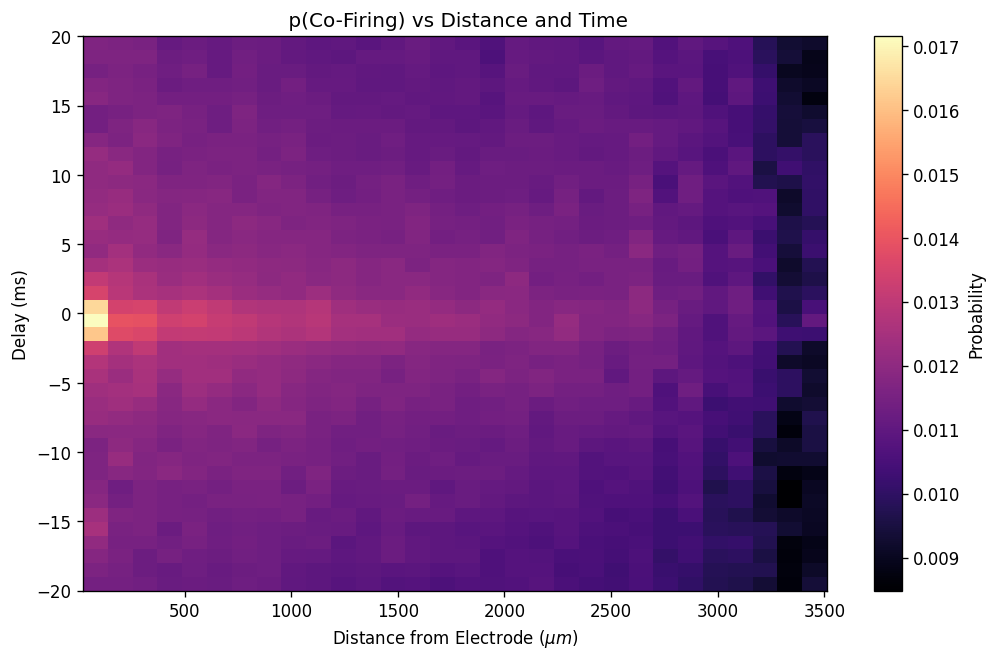

(<Figure size 1200x720 with 2 Axes>,
 <Axes: title={'center': ' p(Co-Firing) vs Distance and Time'}, xlabel='Distance from Electrode ($\\mu m$)', ylabel='Delay (ms)'>)

In [24]:
cft_cfg = CofiringTemporalConfig(start_ms=-20, stop_ms=20, step_ms=1, normalize=False)
cft_analyzer = CofiringTemporalAnalyzer(ds, cft_cfg, selection_prep_config=prep_cfg)
cft_analyzer.plot_avg_cofiring_heatmap()


## Optional: Co-firing GIF

This can be slow on larger datasets.


In [23]:
cfcfg = CofiringTemporalConfig(start_ms=-20, stop_ms=20, step_ms=4, normalize=False)
cfa = CofiringTemporalAnalyzer(ds, cfcfg, selection_prep_config=prep_cfg)

# cfa.plot_avg_cofiring_heatmap()
# cfa.create_theta_gif(output_filename="cofiring_theta_M07463.gif")
cfa.create_grid_gif(output_filename="cofiring_grid_M07463.gif")
display(Image(filename="cofiring_grid_M07463.gif"))


IndexError: boolean index did not match indexed array along dimension 2; dimension is 39 but corresponding boolean dimension is 37

## DCT Spatial Analysis

In [ ]:
dct_an = DCTAnalyzer(ds)
interp_grids = dct_an.compute_interpolated_grids(grid_size=50.0)

avg_dct = DCTAnalyzer.average_dct([g.grid for g in interp_grids])
recon = DCTAnalyzer.reconstruct_from_top_components(
    avg_dct,
    stop_rank=3,
    start_rank=0,
    plot_distribution=True,
)
DCTAnalyzer.plot_reconstructed_grid(reconstructed=recon, res=interp_grids[0])
DCTAnalyzer.extract_and_plot_spatial_frequencies_from_dct(
    avg_dct,
    n_components_stop=3,
    n_components_start=0,
    array_dims=(3800, 2100),
    axis="x",
)


## Per-Recording Distance Fits (Using Per-Recording IFR Peaks)

This section fits the distance-dependent firing model to each recording independently. 
For each recording, IFR peaks are inferred from that recording only and then used in the synergy overlay.



=== Recording 0 ===
IFR samples: 133818; refs: 100
IFR GMM peaks (Hz): [ 0.46  1.11  2.44  4.99 10.98 39.62 97.35]


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (39.6, 97.3 Hz): logL=-16205.6340, BIC=-1169.1088, MI=1.16484
  Model (39.6 Hz): logL=-16581.1253, BIC=-1180.7743, MI=1.12737
[Rate] Likelihood-ratio tests vs full model:
  Model (39.6 Hz): LRT=750.9826, p=2.453e-165
ANOVA F-statistic: 0.07393097238046525, p-value: 0.7857250774223659
Exponential fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 10000.

[Cofiring] Synergy model summary:
  Model (39.6, 97.3 Hz): logL=1835.1645, BIC=-6946.9415, MI=1.39506
  Model (39.6 Hz): logL=1755.7460, BIC=-7222.3818, MI=1.53100
[Cofiring] Likelihood-ratio tests vs full model:
  Model (39.6 Hz): LRT=158.8371, p=2.031e-36
ANOVA F-statistic: 1.9140200872274524, p-value: 0.1666719351692808

=== Recording 1 ===


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:742: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_model.legend(loc='upper left')


IFR samples: 148422; refs: 100
IFR GMM peaks (Hz): [  0.25   1.08   2.74   6.27  14.61  36.85 107.23]

[Rate] Synergy model summary:
  Model (36.8, 107.2 Hz): logL=-16839.5564, BIC=-951.0968, MI=1.43699
  Model (36.8 Hz): logL=-21235.4358, BIC=-970.9726, MI=2.01035
[Rate] Likelihood-ratio tests vs full model:
  Model (36.8 Hz): LRT=8791.7588, p=0.000e+00
ANOVA F-statistic: 0.26722039276942766, p-value: 0.6052596956067097

[Cofiring] Synergy model summary:
  Model (36.8, 107.2 Hz): logL=1720.6578, BIC=-6268.3632, MI=1.89570
  Model (36.8 Hz): logL=2431.6112, BIC=-7722.4227, MI=2.75412
[Cofiring] Likelihood-ratio tests vs full model:
  Model (36.8 Hz): LRT=-1421.9069, p=1.000e+00
ANOVA F-statistic: 2.4062188275210628, p-value: 0.12101233805020592

=== Recording 2 ===
IFR samples: 139748; refs: 100
IFR GMM peaks (Hz): [ 1.14  2.45  7.92 33.34]


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (33.3 Hz): logL=-27117.8050, BIC=-1762.7793, MI=0.96159

[Cofiring] Synergy model summary:
  Model (33.3 Hz): logL=2360.0312, BIC=-7599.8227, MI=1.18431

=== Recording 3 ===
IFR samples: 222678; refs: 100
IFR GMM peaks (Hz): [  0.88   1.8    3.67   6.78  13.07  24.54  53.93 183.05]

[Rate] Synergy model summary:
  Model (53.9, 183.1 Hz): logL=-60565.8010, BIC=-558.5128, MI=0.75904
  Model (53.9 Hz): logL=-59804.2830, BIC=-565.5575, MI=0.70928
[Rate] Likelihood-ratio tests vs full model:
  Model (53.9 Hz): LRT=-1523.0361, p=1.000e+00
ANOVA F-statistic: 0.0008680924220000646, p-value: 0.9764979448829505

[Cofiring] Synergy model summary:
  Model (53.9, 183.1 Hz): logL=1339.4092, BIC=-5502.9586, MI=1.48072
  Model (53.9 Hz): logL=1339.7037, BIC=-5510.4515, MI=1.39180
[Cofiring] Likelihood-ratio tests vs full model:
  Model (53.9 Hz): LRT=-0.5889, p=1.000e+00
ANOVA F-statistic: 0.0009959473706578114, p-value: 0.9748271843854769

=== Recording 4 ===
IF

/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (43.2, 87.4, 331.2 Hz): logL=-13048.1725, BIC=-1991.3580, MI=0.76631
  Model (43.2, 87.4 Hz): logL=-12997.2872, BIC=-1998.3179, MI=0.73754
  Model (43.2 Hz): logL=-38610.2290, BIC=-2015.3284, MI=0.74167
[Rate] Likelihood-ratio tests vs full model:
  Model (43.2, 87.4 Hz): LRT=-101.7706, p=1.000e+00
  Model (43.2 Hz): LRT=51124.1129, p=0.000e+00
ANOVA F-statistic: 0.43391438211679106, p-value: 0.6480084316857007

[Cofiring] Synergy model summary:
  Model (43.2, 87.4, 331.2 Hz): logL=1314.1772, BIC=-5454.4949, MI=2.00633
  Model (43.2, 87.4 Hz): logL=1313.7977, BIC=-5460.5727, MI=1.94998
  Model (43.2 Hz): logL=1722.8160, BIC=-6408.0560, MI=2.24638
[Cofiring] Likelihood-ratio tests vs full model:
  Model (43.2, 87.4 Hz): LRT=0.7590, p=3.836e-01
  Model (43.2 Hz): LRT=-817.2777, p=1.000e+00
ANOVA F-statistic: 0.5518144803712539, p-value: 0.5759623966769756

=== Recording 6 ===
IFR samples: 221358; refs: 100
IFR GMM peaks (Hz): [  0.55   1.65   3.42  

/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:613: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Cofiring] Synergy model summary:
  Model (38.1, 73.3 Hz): logL=1876.5282, BIC=-6581.4759, MI=1.51108
  Model (38.1 Hz): logL=1894.9264, BIC=-6625.1560, MI=1.48369
[Cofiring] Likelihood-ratio tests vs full model:
  Model (38.1 Hz): LRT=-36.7965, p=1.000e+00
ANOVA F-statistic: 0.018620463524285518, p-value: 0.8914739058346408

=== Recording 8 ===
IFR samples: 59940; refs: 100
IFR GMM peaks (Hz): [1.2000e-01 4.1000e-01 1.3100e+00 3.2600e+00 8.0100e+00 2.3230e+01
 5.7120e+01 1.9187e+02]

[Rate] Synergy model summary:
  Model (57.1, 191.9 Hz): logL=-167.2082, BIC=-3711.9135, MI=0.72108
  Model (57.1 Hz): logL=-183.6426, BIC=-3720.3747, MI=0.91450
[Rate] Likelihood-ratio tests vs full model:
  Model (57.1 Hz): LRT=32.8689, p=9.859e-09
ANOVA F-statistic: 0.004980041609061892, p-value: 0.9437475194425033

[Cofiring] Synergy model summary:
  Model (57.1, 191.9 Hz): logL=2580.0409, BIC=-8000.1487, MI=0.84123
  Model (57.1 Hz): logL=2772.2484, BIC=-8425.8320, MI=0.94775
[Cofiring] Likelihood-ra

/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:613: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Cofiring] Synergy model summary:
  Model (46.9, 173.9 Hz): logL=1989.1079, BIC=-6803.4673, MI=0.83356
  Model (46.9 Hz): logL=2779.3987, BIC=-8398.7722, MI=1.05605
[Cofiring] Likelihood-ratio tests vs full model:
  Model (46.9 Hz): LRT=-1580.5816, p=1.000e+00
ANOVA F-statistic: 3.0544131376620673, p-value: 0.08067168948761302

=== Recording 10 ===
IFR samples: 101154; refs: 100
IFR GMM peaks (Hz): [ 0.48  1.34  3.53  7.4  41.39]


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:153: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 12))
/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (41.4 Hz): logL=-25950.3911, BIC=-2296.0693, MI=0.78222


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:613: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Cofiring] Synergy model summary:
  Model (41.4 Hz): logL=2623.6579, BIC=-8081.9217, MI=1.09942

=== Recording 11 ===
IFR samples: 123362; refs: 100
IFR GMM peaks (Hz): [  0.22   1.06   2.54   5.55  13.79  33.29  69.58 178.71]

[Rate] Synergy model summary:
  Model (33.3, 69.6, 178.7 Hz): logL=-6867.0864, BIC=-1321.1076, MI=0.91305
  Model (33.3, 69.6 Hz): logL=-6835.0390, BIC=-1332.6488, MI=0.87273
  Model (33.3 Hz): logL=-6802.8429, BIC=-1342.9174, MI=0.90325
[Rate] Likelihood-ratio tests vs full model:
  Model (33.3, 69.6 Hz): LRT=-64.0947, p=1.000e+00
  Model (33.3 Hz): LRT=-128.4869, p=1.000e+00
ANOVA F-statistic: 0.06848182421677627, p-value: 0.9338118938854854

[Cofiring] Synergy model summary:
  Model (33.3, 69.6, 178.7 Hz): logL=658.8998, BIC=-4138.9980, MI=1.44022
  Model (33.3, 69.6 Hz): logL=663.4770, BIC=-4154.5848, MI=1.55653
  Model (33.3 Hz): logL=660.1283, BIC=-4154.3785, MI=1.56375
[Cofiring] Likelihood-ratio tests vs full model:
  Model (33.3, 69.6 Hz): LRT=-9.1544,

/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (53.1, 199.2 Hz): logL=-2128.8481, BIC=-1936.5217, MI=1.03246
  Model (53.1 Hz): logL=-2129.8131, BIC=-1943.5302, MI=1.02212
[Rate] Likelihood-ratio tests vs full model:
  Model (53.1 Hz): LRT=1.9300, p=1.648e-01
ANOVA F-statistic: 4.227671491931202e-07, p-value: 0.9994812760229088

[Cofiring] Synergy model summary:
  Model (53.1, 199.2 Hz): logL=476.9940, BIC=-3778.0533, MI=2.04828
  Model (53.1 Hz): logL=476.1453, BIC=-3783.2636, MI=2.04002
[Cofiring] Likelihood-ratio tests vs full model:
  Model (53.1 Hz): LRT=1.6973, p=1.926e-01
ANOVA F-statistic: 4.3115458225314976e-07, p-value: 0.9994761557781623

=== Recording 14 ===
IFR samples: 123652; refs: 100
IFR GMM peaks (Hz): [ 0.68  1.94  7.79 37.1  71.59]


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (37.1, 71.6 Hz): logL=-48268.1525, BIC=-1013.6962, MI=0.66608
  Model (37.1 Hz): logL=-47032.1447, BIC=-1022.1190, MI=0.64332
[Rate] Likelihood-ratio tests vs full model:
  Model (37.1 Hz): LRT=-2472.0156, p=1.000e+00
ANOVA F-statistic: 0.03844951710318495, p-value: 0.8445631982664554

[Cofiring] Synergy model summary:
  Model (37.1, 71.6 Hz): logL=1310.4172, BIC=-5457.4245, MI=1.23792
  Model (37.1 Hz): logL=1310.9052, BIC=-5464.1541, MI=1.26115
[Cofiring] Likelihood-ratio tests vs full model:
  Model (37.1 Hz): LRT=-0.9760, p=1.000e+00
ANOVA F-statistic: 0.0383614617077739, p-value: 0.84473901952194

=== Recording 15 ===
IFR samples: 81318; refs: 100
IFR GMM peaks (Hz): [6.0000e-02 7.1000e-01 1.9200e+00 4.9100e+00 1.1910e+01 2.8540e+01
 5.7640e+01 1.9451e+02]


/Users/danielrebbin/Documents/GitHub/ephax/ephax/analyzers/firing_distance.py:179: OptimizeWarning: Covariance of the parameters could not be estimated
  exp_popt, _ = curve_fit(_exp_fun, x_valid, y_valid, p0=[A0, k0, C0], maxfev=10000)



[Rate] Synergy model summary:
  Model (57.6, 194.5 Hz): logL=-24863.9780, BIC=-1806.5961, MI=0.66464
  Model (57.6 Hz): logL=-28247.1024, BIC=-1813.3906, MI=0.83616
[Rate] Likelihood-ratio tests vs full model:
  Model (57.6 Hz): LRT=6766.2487, p=0.000e+00
ANOVA F-statistic: 0.03593563961880996, p-value: 0.8496677199518298

[Cofiring] Synergy model summary:
  Model (57.6, 194.5 Hz): logL=1890.6657, BIC=-6806.3533, MI=1.11797
  Model (57.6 Hz): logL=1310.5397, BIC=-7340.9071, MI=1.96441
[Cofiring] Likelihood-ratio tests vs full model:
  Model (57.6 Hz): LRT=1160.2520, p=2.653e-254
ANOVA F-statistic: 0.26806577242191126, p-value: 0.6046895490370245

=== Recording 16 ===
IFR samples: 37446; refs: 100
IFR GMM peaks (Hz): [1.3000e-01 5.4000e-01 1.7200e+00 1.3080e+01 4.5050e+01 1.5213e+02]

[Rate] Synergy model summary:
  Model (45.0, 152.1 Hz): logL=224.0231, BIC=-3780.8849, MI=1.27588
  Model (45.0 Hz): logL=223.5505, BIC=-3785.2156, MI=1.25388
[Rate] Likelihood-ratio tests vs full model:


,recording_idx,n_ifr_samples,n_refs,n_gmm_peaks,gmm_peaks_hz,gmm_weights,n_rate_bins,n_cofiring_bins
0,0,133818,100,7,"[0.459, 1.114, 2.44, 4.988, 10.981, 39.622, 97...","[0.2205, 0.0891, 0.0548, 0.1637, 0.2043, 0.127...",66,66
1,1,148422,100,7,"[0.252, 1.079, 2.744, 6.269, 14.612, 36.845, 1...","[0.2015, 0.2993, 0.079, 0.0324, 0.0294, 0.2019...",73,73
2,2,139748,100,4,"[1.142, 2.446, 7.924, 33.339]","[0.3606, 0.1237, 0.152, 0.3636]",73,73
3,3,222678,100,8,"[0.882, 1.804, 3.669, 6.784, 13.075, 24.539, 5...","[0.2227, 0.1317, 0.1864, 0.0702, 0.2253, 0.039...",73,73
4,4,124782,100,6,"[0.578, 1.584, 3.611, 11.133, 26.074, 93.507]","[0.2706, 0.0945, 0.1968, 0.0584, 0.1999, 0.1798]",70,70
5,5,68816,100,8,"[0.042, 0.552, 1.784, 8.007, 23.733, 43.171, 8...","[0.2272, 0.0754, 0.0803, 0.1483, 0.2759, 0.015...",73,73
6,6,221358,100,8,"[0.555, 1.651, 3.416, 6.292, 13.761, 32.665, 6...","[0.1386, 0.1261, 0.1548, 0.2104, 0.019, 0.0135...",73,73
7,7,136388,100,8,"[0.252, 0.85, 1.723, 3.219, 5.883, 12.358, 38....","[0.0803, 0.1264, 0.0648, 0.2292, 0.1286, 0.174...",73,73
8,8,59940,100,8,"[0.124, 0.406, 1.307, 3.258, 8.012, 23.232, 57...","[0.0405, 0.1654, 0.1359, 0.1036, 0.1656, 0.154...",49,49
9,9,66336,100,8,"[0.136, 0.586, 1.813, 4.588, 7.33, 21.92, 46.9...","[0.173, 0.1448, 0.0885, 0.1891, 0.0205, 0.1537...",73,73


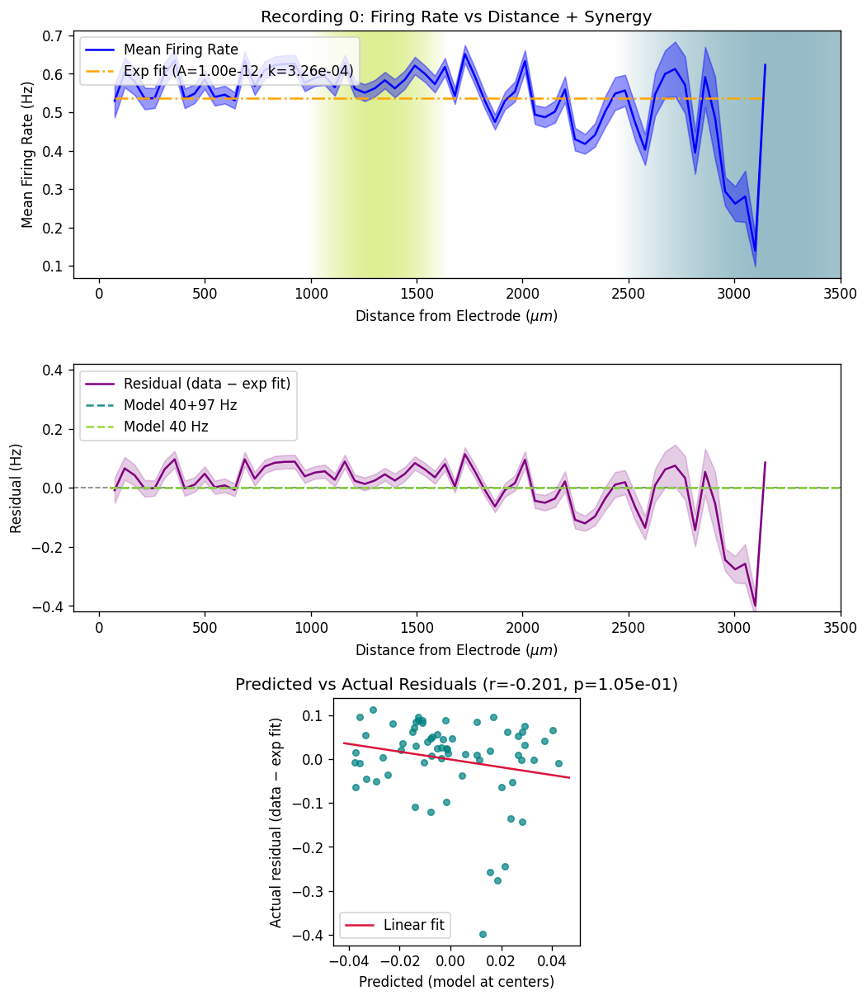

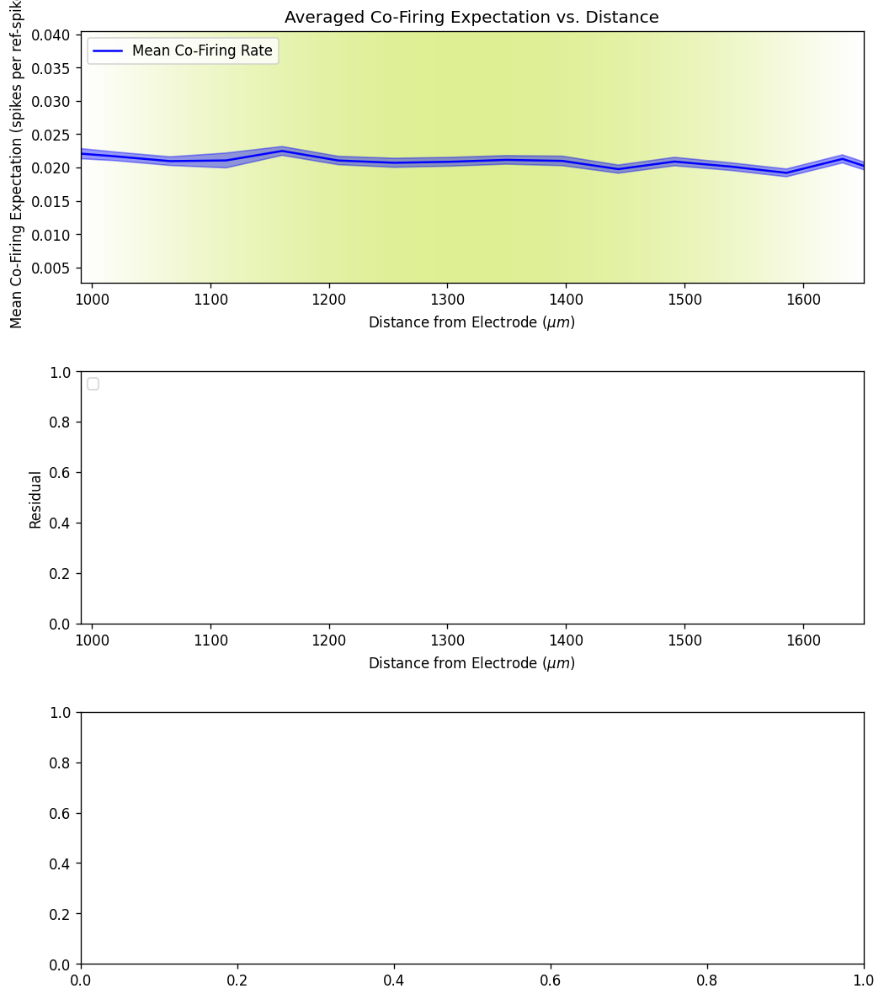

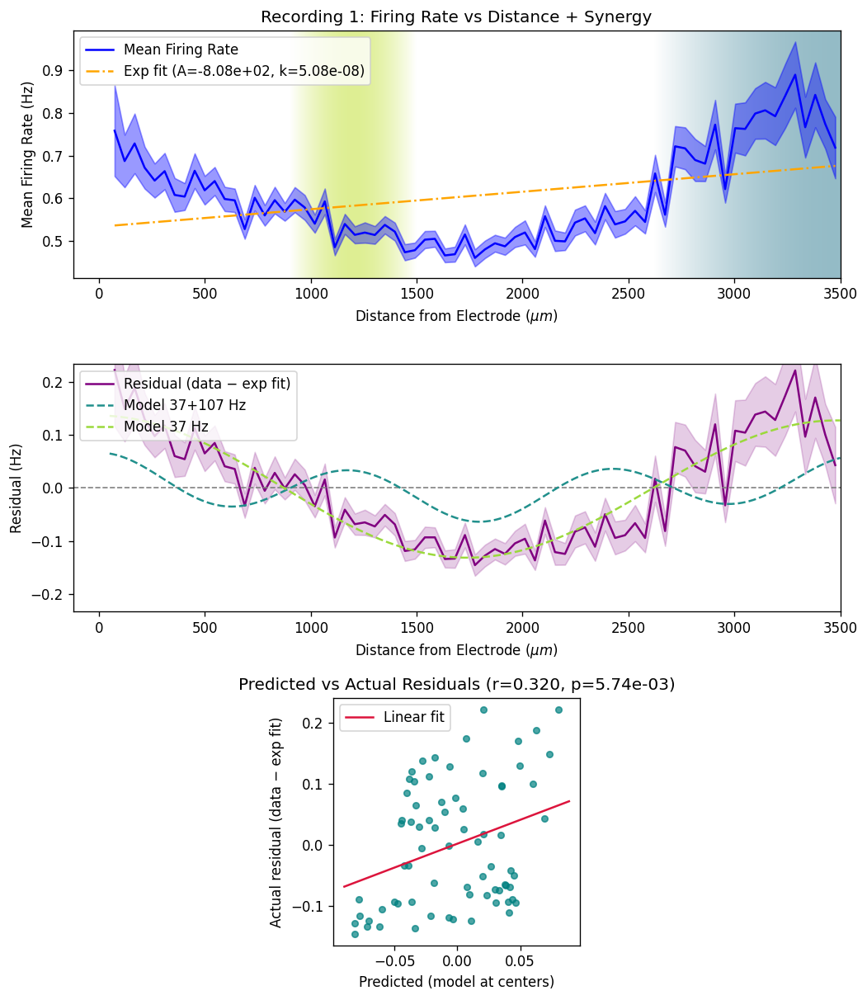

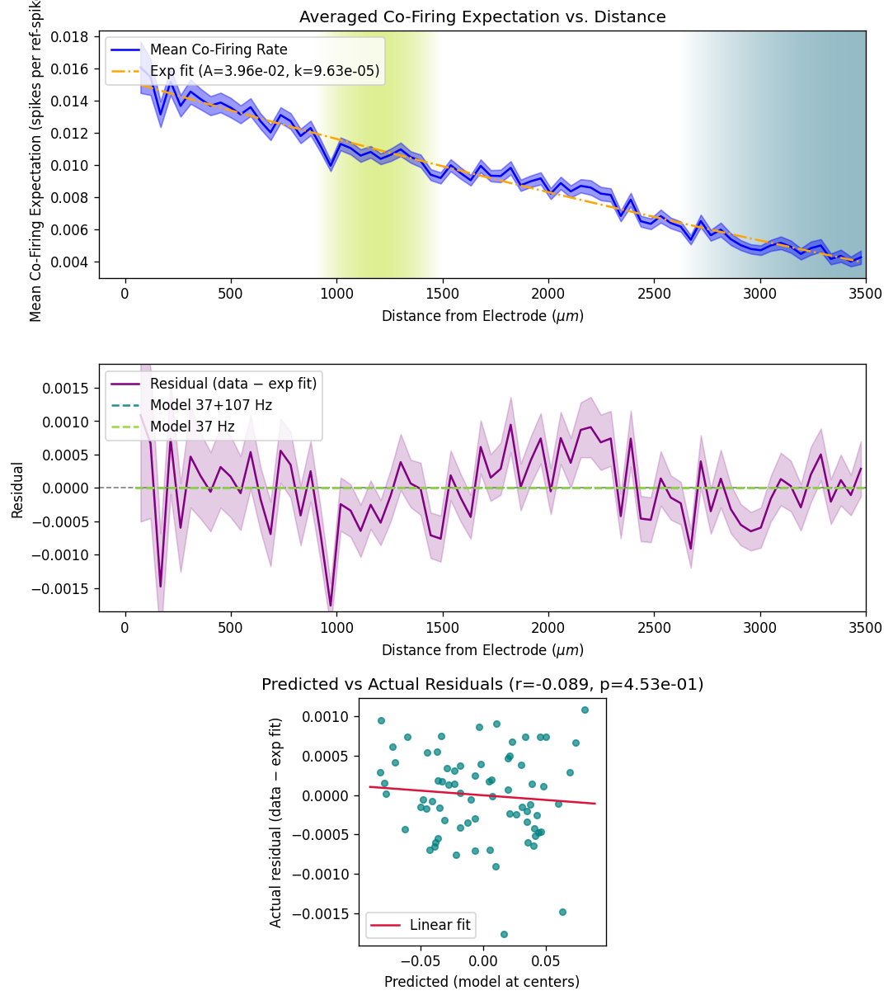

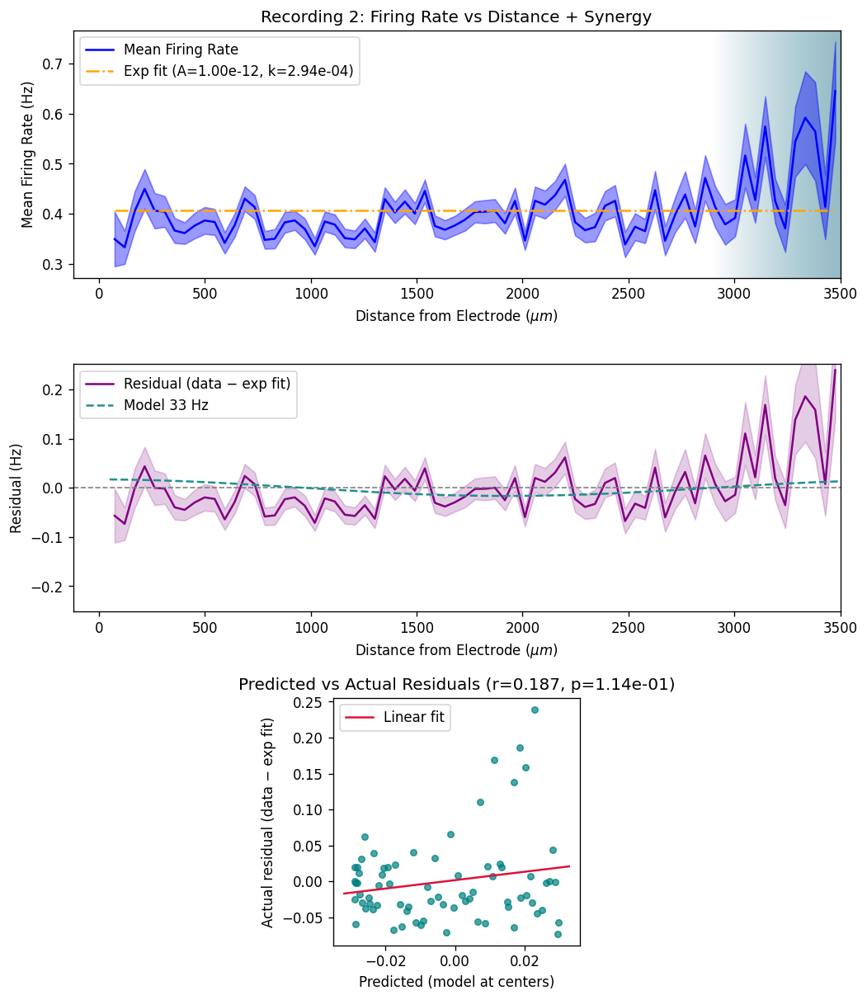

...

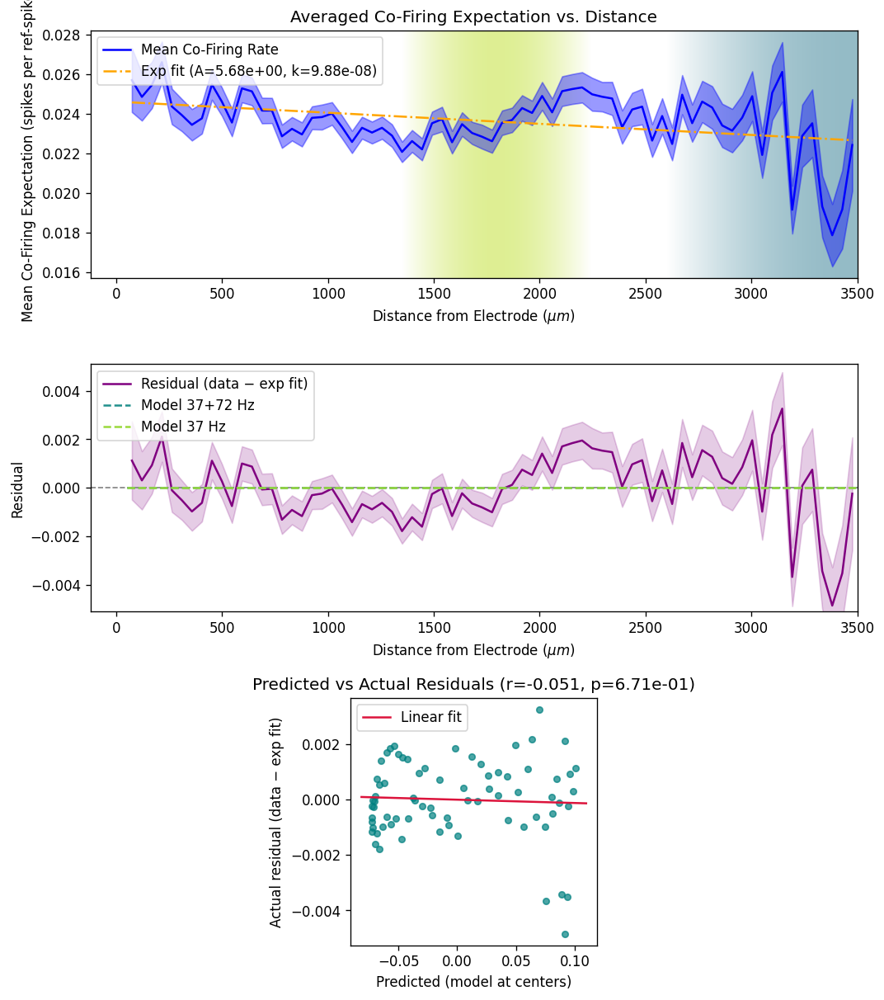

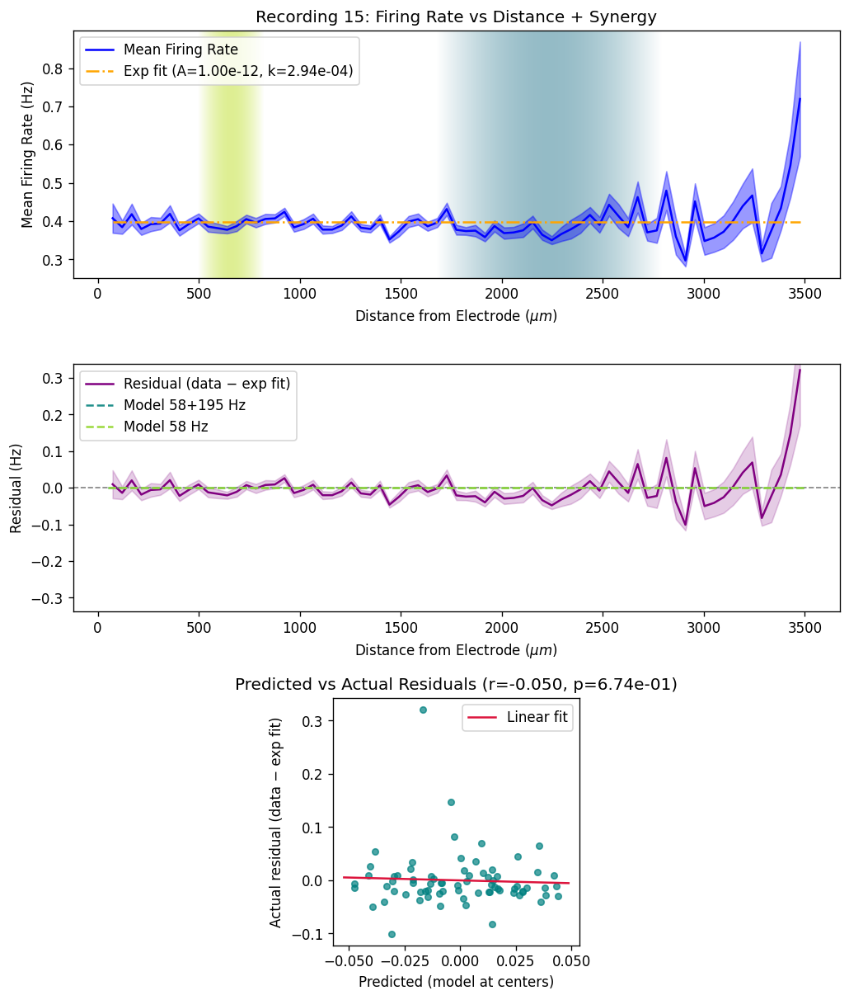

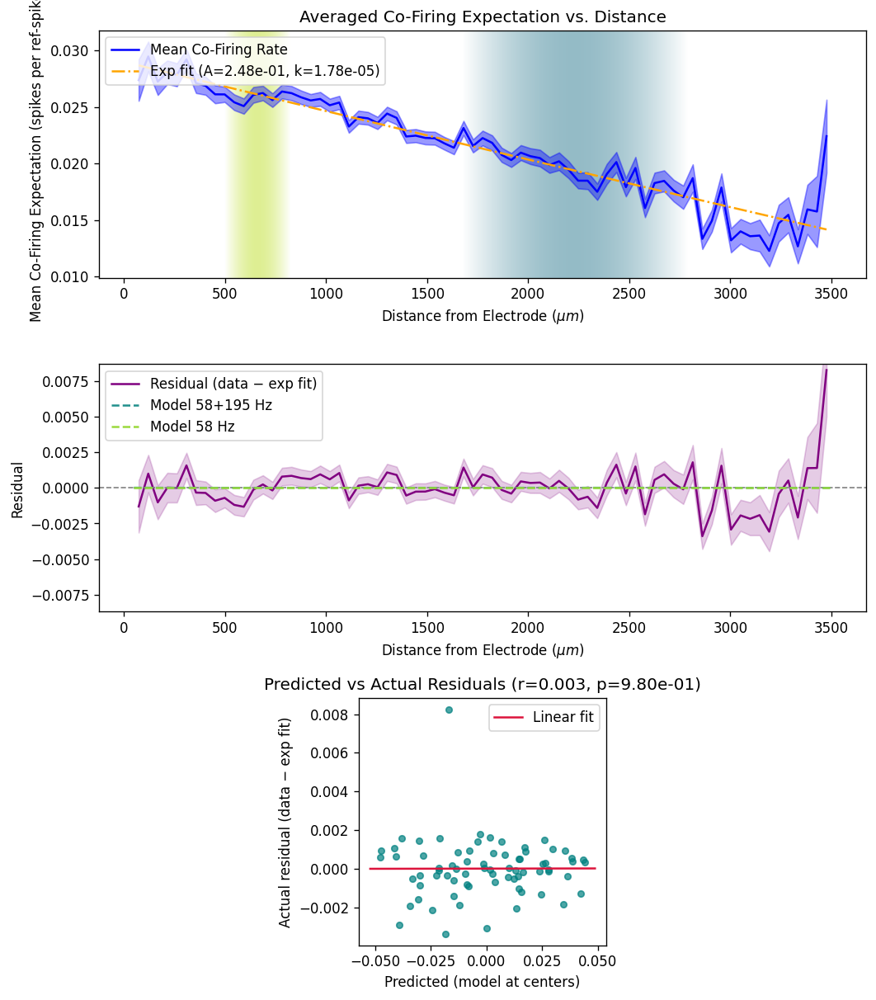

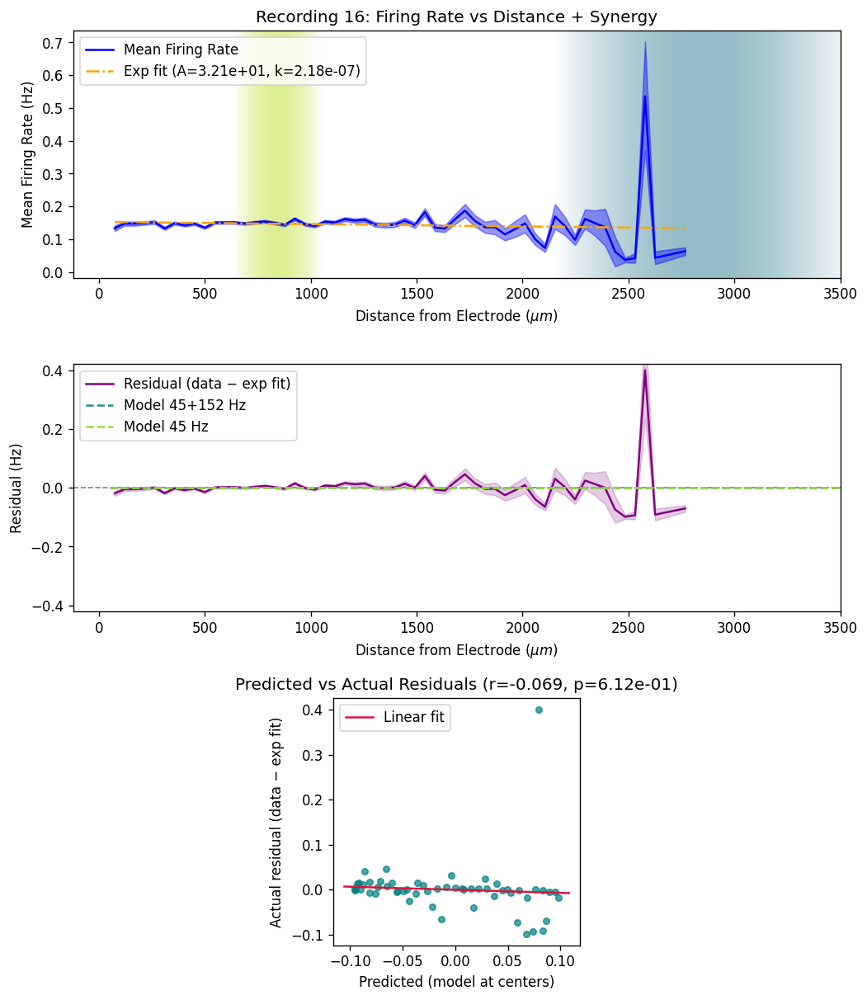

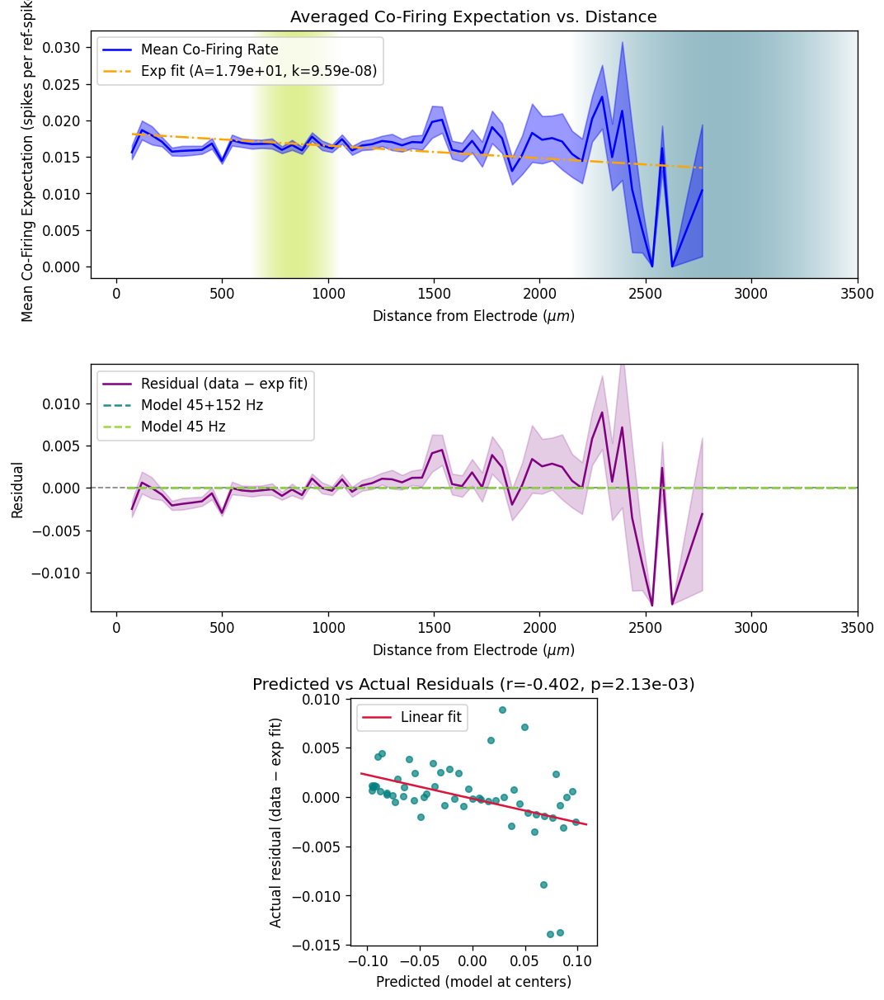

In [16]:
import pandas as pd
from ephax import RestingActivityDataset

COFIRING_PM_MS = 2.0
per_recording_rows = []

for rec_idx, rec in enumerate(ds.recordings):
    print(f"\n=== Recording {rec_idx} ===")
    ds_i = RestingActivityDataset(recordings=[rec], sf=ds.sf)

    # Keep the same selection strategy as the pooled analysis
    refs_i = ds_i.select_ref_electrodes(prep_cfg)
    n_refs = int(refs_i[0].size) if refs_i and hasattr(refs_i[0], 'size') else 0

    # Infer IFR peaks for this recording only
    ifr_i = IFRAnalyzer.from_dataset(ds_i, config=ifr_cfg, selection_prep_config=prep_cfg)
    peaks_i = ifr_i.peaks()

    peak_hz = np.array([])
    weights = np.array([])
    try:
        fit_i = ifr_i.fit_gmm(peaks_i.values)
        peak_hz = np.asarray(fit_i.means_hz, dtype=float)
        weights = np.asarray(fit_i.weights, dtype=float)
    except Exception as exc:
        print(f"IFR GMM fit failed for recording {rec_idx}: {exc}")

    print(f"IFR samples: {peaks_i.values.size}; refs: {n_refs}")
    if peak_hz.size:
        print("IFR GMM peaks (Hz):", np.round(np.sort(peak_hz), 2))
    else:
        print("No IFR peaks available for synergy overlay.")

    # Distance-dependent firing fit for this recording
    fd_i = FiringDistanceAnalyzer(
        ds_i,
        selection_prep_config=prep_cfg,
        ifr_config=ifr_cfg,
        v_eph=0.1,
        v_ax=0.45,
    )

    rate_i = fd_i.avg_rate_vs_distance()
    n_rate_bins = int(rate_i.binned.centers.size)
    if n_rate_bins == 0:
        print("No valid rate-vs-distance bins for this recording; skipping rate plot.")
    else:
        fd_i.plot_rate_with_synergy(
            rate_i,
            title=f"Recording {rec_idx}: Firing Rate vs Distance + Synergy",
            show_exponential_fit=True,
        )

    # Distance-dependent co-firing fit for this recording
    cof_i = fd_i.cofiring_avg_vs_distance(plusminus_ms=COFIRING_PM_MS, log=False)
    n_cof_bins = int(cof_i.binned.centers.size)
    if n_cof_bins == 0:
        print("No valid cofiring-vs-distance bins for this recording; skipping cofiring plot.")
    else:
        fd_i.plot_cofiring_with_synergy(
            cof_i,
            show_exponential_fit=True,
        )

    per_recording_rows.append(
        {
            'recording_idx': rec_idx,
            'n_ifr_samples': int(peaks_i.values.size),
            'n_refs': n_refs,
            'n_gmm_peaks': int(peak_hz.size),
            'gmm_peaks_hz': np.round(np.sort(peak_hz), 3).tolist(),
            'gmm_weights': np.round(weights, 4).tolist(),
            'n_rate_bins': n_rate_bins,
            'n_cofiring_bins': n_cof_bins,
        }
    )

per_recording_summary = pd.DataFrame(per_recording_rows)
per_recording_summary
